# Ejericio Practico 1

#### Cargue una imagen distinta a la trabajada en clase y aplique todas las operaciones básicas de modificación de la imagen usando una de las librerías vistas en clase (PIL u OpenCV)

1. Se carga imagen con OpenCV

In [ ]:
#Instalacion de bibliotecas
!pip install opencv-python


  Using cached opencv_python-4.13.0.90-cp37-abi3-win_amd64.whl.metadata (20 kB)
Using cached opencv_python-4.13.0.90-cp37-abi3-win_amd64.whl (40.2 MB)


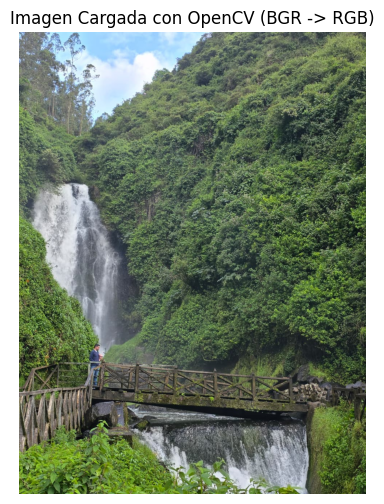

In [ ]:
import cv2
import matplotlib.pyplot as plt

# Definimos la ruta que proporcionaste
ruta_archivo = "cascada.jpeg"

try:
    # 1. Cargar la imagen con OpenCV
    # Por defecto, cv2.imread carga la imagen en formato BGR
    img_bgr = cv2.imread(ruta_archivo)

    # Verificamos si la imagen cargó correctamente
    if img_bgr is None:
        raise FileNotFoundError

    # 2. CONVERSIÓN CRÍTICA: De BGR a RGB
    # Esto es necesario para que Matplotlib muestre los colores reales
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

    # 3. Mostrar la imagen con Matplotlib
    plt.figure(figsize=(8, 6))
    plt.imshow(img_rgb)
    
    # 4. Configurar la visualización
    plt.title("Imagen Cargada con OpenCV (BGR -> RGB)")
    plt.axis('off')  # Oculta los ejes
    plt.show()

except FileNotFoundError:
    print(f"Error: No se encontró el archivo en: {ruta_archivo}")
except Exception as e:
    print(f"Ocurrió un error inesperado: {e}")

2. Operaciones geometricas 

Dimensiones: 960px de ancho x 1280px de alto | Canales: 3


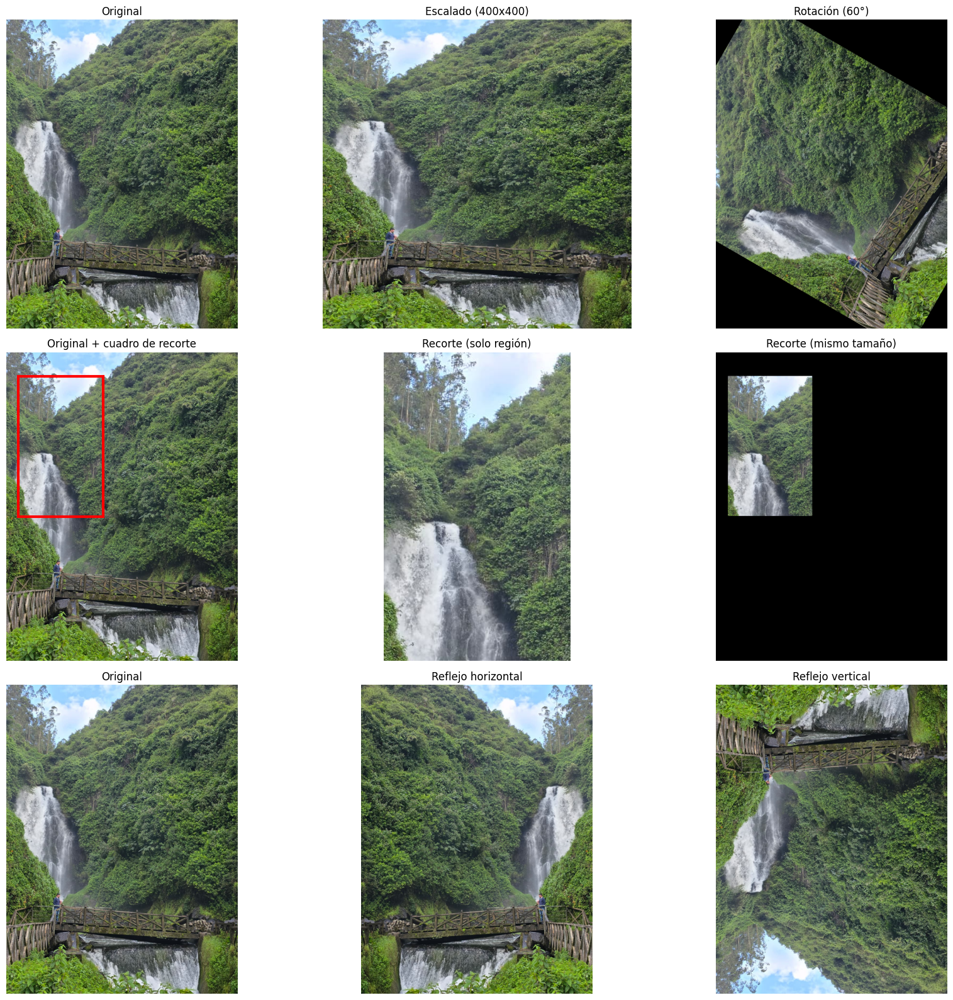

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
# 1. Cargar la imagen con OpenCV
ruta_archivo = "cascada.jpeg"

img_bgr = cv2.imread(ruta_archivo)

if img_bgr is None:
    print(f"Error: No se encontró la imagen en {ruta_archivo}")
else:
    alto, ancho, canales = img_bgr.shape
    print(f"Dimensiones: {ancho}px de ancho x {alto}px de alto | Canales: {canales}")

    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

#2) ESCALADO
    img_resizada = cv2.resize(img_rgb, (400, 400)) #Escalado cuadrado de 400*400

#3) ROTACIÓN
    centro = (ancho // 2, alto // 2) #Se encuentra el centro
    matriz = cv2.getRotationMatrix2D(centro, 60, 1.0)  #Se rota 60 grados sin zoom (Ultimo valor si es mayor que 1 se acerca si es menor que 1 se aleja)
    img_rotada = cv2.warpAffine(img_rgb, matriz, (ancho, alto))

#4) RECORTE (coordenadas)
    x1, y1 = 50, 100
    x2, y2 = 400, 680

    # Seguridad para que no se vaya de los limites de la imagen  
    x1 = max(0, min(x1, ancho - 1))
    x2 = max(0, min(x2, ancho))
    y1 = max(0, min(y1, alto - 1))
    y2 = max(0, min(y2, alto))

    recorte = img_rgb[y1:y2, x1:x2]

    # Recorte en lienzo del mismo tamaño (sin deformar)
    recorte_mismo_tamano = np.zeros_like(img_rgb)  # fondo negro
    recorte_mismo_tamano[y1:y2, x1:x2] = recorte

#5) REFLEJO
    reflejo_horizontal = cv2.flip(img_rgb, 1)
    reflejo_vertical = cv2.flip(img_rgb, 0)

    # --------- VISUALIZACIÓN 3x3 ----------
    fig, axs = plt.subplots(3, 3, figsize=(18, 16))

    # Fila 1: Original | Escalado | Rotación
    axs[0, 0].imshow(img_rgb)
    axs[0, 0].set_title("Original")
    axs[0, 1].imshow(img_resizada)
    axs[0, 1].set_title("Escalado (400x400)")
    axs[0, 2].imshow(img_rotada)
    axs[0, 2].set_title("Rotación (60°)")

    # Fila 2: Original con cuadro | Recorte (solo) | Recorte (mismo tamaño)
    axs[1, 0].imshow(img_rgb)
    axs[1, 0].set_title("Original + cuadro de recorte")
    rect = Rectangle((x1, y1), x2 - x1, y2 - y1,
                     linewidth=3, edgecolor="red", facecolor="none")
    axs[1, 0].add_patch(rect)

    axs[1, 1].imshow(recorte)
    axs[1, 1].set_title("Recorte (solo región)")

    axs[1, 2].imshow(recorte_mismo_tamano)
    axs[1, 2].set_title("Recorte (mismo tamaño)")

    # Fila 3: Original | Reflejo H | Reflejo V
    axs[2, 0].imshow(img_rgb)
    axs[2, 0].set_title("Original")
    axs[2, 1].imshow(reflejo_horizontal)
    axs[2, 1].set_title("Reflejo horizontal")
    axs[2, 2].imshow(reflejo_vertical)
    axs[2, 2].set_title("Reflejo vertical")

    for ax in axs.ravel():
        ax.axis("off")

    plt.tight_layout()
    plt.show()

3. Operaciones de punto

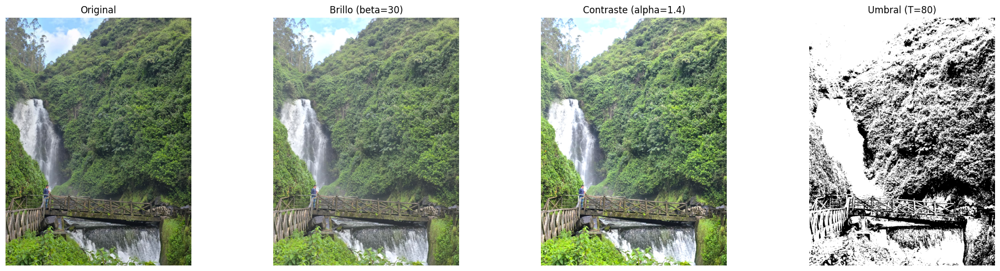

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Ruta de la imagen
ruta_archivo = "cascada.jpeg"

# 1. Cargar la imagen
img_bgr = cv2.imread(ruta_archivo)

if img_bgr is None:
    print(f"Error: No se encontró la imagen en {ruta_archivo}")
else:
    # Convertir a RGB para visualización en plt
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

    # --- OPERACIONES DE PUNTO ---

    # A. Ajuste de Brillo
    # cv2.convertScaleAbs(img, alpha, beta) -> alpha es contraste, beta es brillo
    # Para solo brillo, dejamos alpha=1 y sumamos beta=50
    img_brillo = cv2.convertScaleAbs(img_rgb, alpha=1.0, beta=30)

    # B. Ajuste de Contraste
    # Multiplicamos por alpha 
    img_contraste = cv2.convertScaleAbs(img_rgb, alpha=1.4, beta=0)

    # C. Umbralización (Thresholding)
    # 1. Convertir a gris
    img_gris = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
    # 2. Aplicar umbral: cv2.threshold(imagen, valor_umbral, valor_max, tipo)
    _, img_umbral = cv2.threshold(img_gris, 80, 255, cv2.THRESH_BINARY)

    # --- VISUALIZACIÓN ---
    fig, axs = plt.subplots(1, 4, figsize=(20, 5))

    axs[0].imshow(img_rgb)
    axs[0].set_title("Original")

    axs[1].imshow(img_brillo)
    axs[1].set_title("Brillo (beta=30)")

    axs[2].imshow(img_contraste)
    axs[2].set_title("Contraste (alpha=1.4)")

    axs[3].imshow(img_umbral, cmap='gray')
    axs[3].set_title("Umbral (T=80)")

    for ax in axs: ax.axis('off')
    plt.tight_layout()
    plt.show()

4. Operaciones de Vecindad

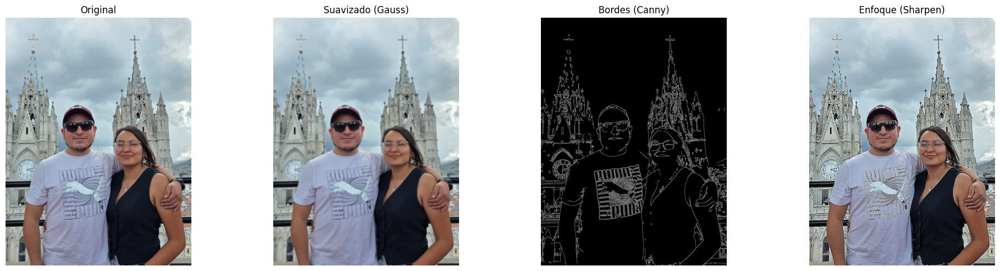

In [ ]:
import cv2
import matplotlib.pyplot as plt

# Ruta de la imagen
ruta_archivo = "pareja.jpeg"

# 1. Cargar la imagen
img_bgr = cv2.imread(ruta_archivo)

if img_bgr is None:
    print(f"Error: No se encontró la imagen en {ruta_archivo}")
else:
    # Convertir a RGB para visualización correcta en Matplotlib
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

    # --- OPERACIONES DE VECINDAD (FILTROS) ---

    # A. Suavizado (Gaussian Blur)
    # (15, 15) es el tamaño del kernel (debe ser impar). A mayor número, más borroso.
    img_gauss = cv2.GaussianBlur(img_rgb, (9, 9), 0)

    # B. Detección de Bordes (Canny)
    # Canny es más avanzado que FIND_EDGES. 100 y 200 son los umbrales de detección.
    # Convertimos primero a gris para una mejor detección de bordes
    #img_gris = cv2.cvtColor(img_gauss, cv2.COLOR_BGR2GRAY)
    img_gris = cv2.cvtColor(img_rgb, cv2.COLOR_BGR2GRAY)
    #img_bordes = cv2.Canny(img_gris, 20, 100)
    img_bordes = cv2.Canny(img_gris, 80, 200)
    # C. Enfoque (Sharpening)
    # OpenCV no tiene un "Sharpen" directo, se usa un kernel personalizado
    kernel_sharpen = np.array([[-1, -1, -1], 
                               [-1,  9, -1], 
                               [-1, -1, -1]])
    img_enfoque = cv2.filter2D(img_rgb, -1, kernel_sharpen)

    # --- VISUALIZACIÓN ---
    fig, axs = plt.subplots(1, 4, figsize=(20, 5))

    axs[0].imshow(img_rgb)
    axs[0].set_title("Original")

    axs[1].imshow(img_gauss)
    axs[1].set_title("Suavizado (Gauss)")

    # Usamos cmap='gray' porque Canny devuelve una imagen de un solo canal
    axs[2].imshow(img_bordes, cmap='gray')
    axs[2].set_title("Bordes (Canny)")

    axs[3].imshow(img_enfoque)
    axs[3].set_title("Enfoque (Sharpen)")

    for ax in axs: ax.axis('off')
    plt.tight_layout()
    plt.show()

#### Tome una foto con la cámara de su computador, imprima sus características como tamaño y forma, luego recórtela para que solo se pueda observar los ojos de una persona.

1. Capturo imagen 

In [ ]:
import cv2

# 1. Inicializar la cámara (0 es la cámara por defecto)
cap = cv2.VideoCapture(0)

if not cap.isOpened():
    print("Error: No se pudo acceder a la cámara.")
else:
    print("Cámara abierta. Presiona 's' para guardar una foto o 'q' para salir.")

    while True:
        # 2. Leer un frame de la cámara
        ret, frame = cap.read()

        if not ret:
            print("Error al capturar el video.")
            break

        # 3. Mostrar el video en vivo en una ventana
        cv2.imshow('Presiona S para tomar foto', frame)

        # 4. Escuchar el teclado
        key = cv2.waitKey(1) & 0xFF

        if key == ord('s'):  # Si presiona 's', guarda la imagen
            nombre_foto = "foto_capturada.jpg"
            cv2.imwrite(nombre_foto, frame)
            print(f"¡Foto guardada como {nombre_foto}!")
            break
        
        elif key == ord('q'):  # Si presiona 'q', sale sin guardar
            break

    # 5. Liberar la cámara y cerrar ventanas
    cap.release()
    cv2.destroyAllWindows()

Cámara abierta. Presiona 's' para guardar una foto o 'q' para salir.
¡Foto guardada como foto_capturada.jpg!


2. Caracteristicas de la imagen y recorte de ojos

Dimensiones: 640px de ancho x 480px de alto | Canales: 3


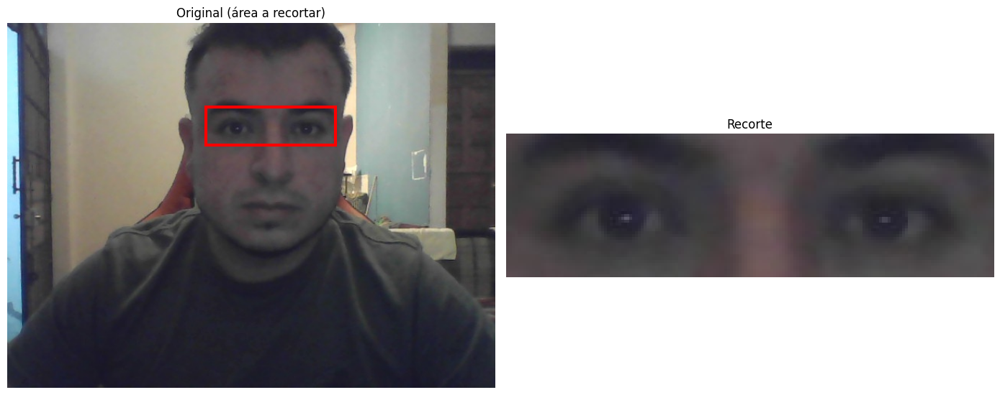

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
    #Carga de imagen 
ruta_archivo = "foto_capturada_persona.jpg"

img_bgr = cv2.imread(ruta_archivo)

if img_bgr is None:
    print(f"Error: No se encontró la imagen en {ruta_archivo}")
else:
    alto, ancho, canales = img_bgr.shape
    print(f"Dimensiones: {ancho}px de ancho x {alto}px de alto | Canales: {canales}")

    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

    # Coordenadas del recorte (x1,y1) esquina sup-izq y (x2,y2) esquina inf-der
    x1, y1 = 260, 110
    x2, y2 = 430, 160

    # Seguridad: límites
    x1 = max(0, min(x1, ancho - 1))
    x2 = max(0, min(x2, ancho))
    y1 = max(0, min(y1, alto - 1))
    y2 = max(0, min(y2, alto))

    recorte = img_rgb[y1:y2, x1:x2]

    # ---- Visualización: SOLO original + recorte ----
    fig, axs = plt.subplots(1, 2, figsize=(14, 7))

    # Original con rectángulo rojo del recorte
    axs[0].imshow(img_rgb)
    axs[0].set_title("Original (área a recortar)")
    rect = Rectangle((x1, y1), x2 - x1, y2 - y1,
                     linewidth=3, edgecolor="red", facecolor="none")
    axs[0].add_patch(rect)
    axs[0].axis("off")

    # Recorte
    axs[1].imshow(recorte)
    axs[1].set_title("Recorte")
    axs[1].axis("off")

    plt.tight_layout()
    plt.show()

#### A la misma imagen tomada con la cámara, rotéla 180 grados, realice el reflejo de ella y mejore su enfoque si es posible.

1. Carga Imagen, rotacion 180 y reflejo

Dimensiones: 640px (ancho) x 480px (alto) | Canales: 3 | dtype: uint8


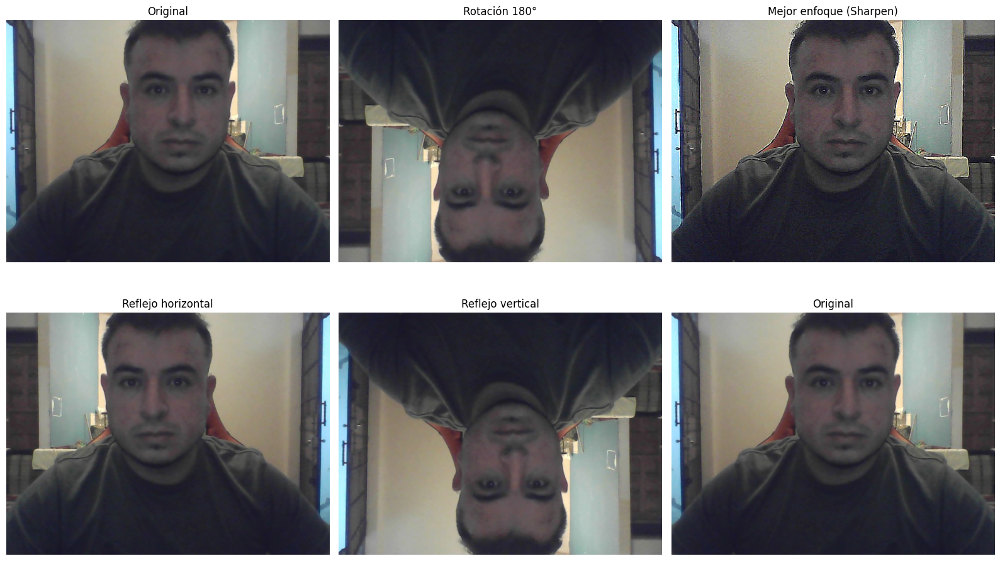

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Carga imagen 
ruta_archivo = "foto_capturada_persona.jpg"
img_bgr = cv2.imread(ruta_archivo)

if img_bgr is None:
    print(f"Error: No se encontró la imagen en {ruta_archivo}")
else:
    alto, ancho, canales = img_bgr.shape
    print(f"Dimensiones: {ancho}px (ancho) x {alto}px (alto) | Canales: {canales} | dtype: {img_bgr.dtype}")

    # BGR -> RGB para mostrar con matplotlib
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

    # Rotación 180° (matriz afín) --------
    centro = (ancho // 2, alto // 2)
    M = cv2.getRotationMatrix2D(centro, 180, 1.0)  # 180° sin zoom
    img_rotada_180 = cv2.warpAffine(img_rgb, M, (ancho, alto))

    # Reflejos --------
    reflejo_horizontal = cv2.flip(img_rgb, 1)  # izquierda-derecha
    reflejo_vertical   = cv2.flip(img_rgb, 0)  # arriba-abajo

    # Mejorar enfoque / nitidez --------
    
    kernel_sharp = np.array([[ -1, -1,  -1],
                             [-1,  9, -1],
                             [ -1, -1,  -1]])
    img_nitida_kernel = cv2.filter2D(img_rgb, -1, kernel_sharp)

    # Visualización --------
    fig, axs = plt.subplots(2, 3, figsize=(16, 10))

    axs[0, 0].imshow(img_rgb)
    axs[0, 0].set_title("Original")

    axs[0, 1].imshow(img_rotada_180)
    axs[0, 1].set_title("Rotación 180°")

    axs[0, 2].imshow(img_nitida_kernel)
    axs[0, 2].set_title("Mejor enfoque (Sharpen)")

    axs[1, 0].imshow(reflejo_horizontal)
    axs[1, 0].set_title("Reflejo horizontal")

    axs[1, 1].imshow(reflejo_vertical)
    axs[1, 1].set_title("Reflejo vertical")

    axs[1, 2].imshow(img_rgb)
    axs[1, 2].set_title("Original")

    for ax in axs.ravel():
        ax.axis("off")

    plt.tight_layout()
    plt.show()


El mejor enfoque se lo optiene utilizando el método de sharpen, en conjunto con la configuracion de kernel fuerte:
        [ [-1, -1, -1],
        [-1,  9, -1],
        [-1, -1, -1]]



#### Toma una foto con la cámara del computador a una persona con lentes y aplique la detección de bordes con el fin de detectar solo los lentes de la persona y su silueta sin usar componentes adicionales que los vistos en clases.

In [ ]:
import cv2

# 1. Inicializar la cámara (0 es la cámara por defecto)
cap = cv2.VideoCapture(0)

if not cap.isOpened():
    print("Error: No se pudo acceder a la cámara.")
else:
    print("Cámara abierta. Presiona 's' para guardar una foto o 'q' para salir.")

    while True:
        # 2. Leer un frame de la cámara
        ret, frame = cap.read()

        if not ret:
            print("Error al capturar el video.")
            break

        # 3. Mostrar el video en vivo en una ventana
        cv2.imshow('Presiona S para tomar foto', frame)

        # 4. Escuchar el teclado
        key = cv2.waitKey(1) & 0xFF

        if key == ord('s'):  # Si presiona 's', guarda la imagen
            nombre_foto = "foto_capturada.jpg"
            cv2.imwrite(nombre_foto, frame)
            print(f"¡Foto guardada como {nombre_foto}!")
            break
        
        elif key == ord('q'):  # Si presiona 'q', sale sin guardar
            break

    # 5. Liberar la cámara y cerrar ventanas
    cap.release()
    cv2.destroyAllWindows()


Cámara abierta. Presiona 's' para guardar una foto o 'q' para salir.
¡Foto guardada como foto_capturada.jpg!


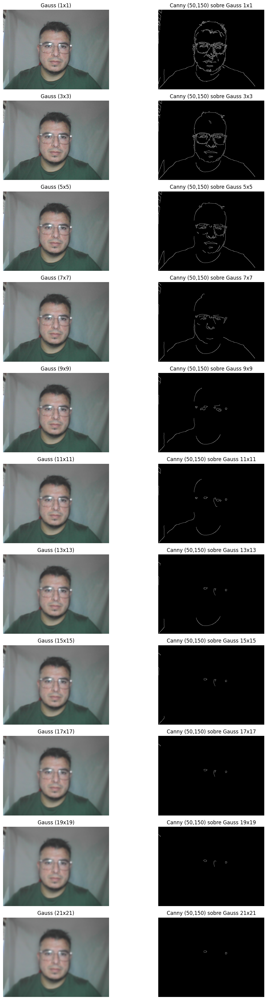

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

ruta_archivo = "foto_capturada.jpg"
img_bgr = cv2.imread(ruta_archivo)

if img_bgr is None:
    print(f"Error: No se encontró la imagen en {ruta_archivo}")
else:
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

    kernels = list(range(1, 22, 2))  # 3..21 impares
    n = len(kernels)

    # 11 filas x 2 columnas: (Gauss | Canny)
    fig, axs = plt.subplots(n, 2, figsize=(12, 3*n))

    for i, k in enumerate(kernels):
        gauss = cv2.GaussianBlur(img_rgb, (k, k), 0)

        # Canny sobre la imagen suavizada
        gray = cv2.cvtColor(gauss, cv2.COLOR_RGB2GRAY)
        edges = cv2.Canny(gray, 40, 140)

        axs[i, 0].imshow(gauss)
        axs[i, 0].set_title(f"Gauss ({k}x{k})")
        axs[i, 0].axis("off")

        axs[i, 1].imshow(edges, cmap="gray")
        axs[i, 1].set_title(f"Canny (50,150) sobre Gauss {k}x{k}")
        axs[i, 1].axis("off")

    plt.tight_layout()
    plt.show()

Se selecciona Gauss 3*3 y se procede a buscar la mejor opcion de Canny

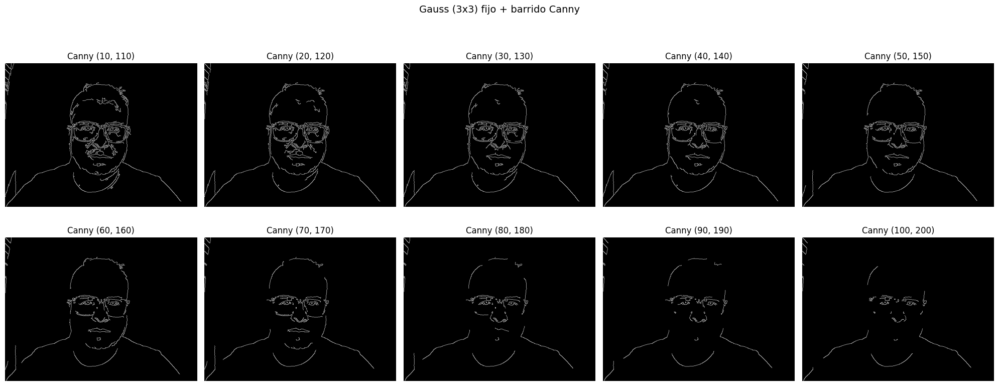

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

ruta_archivo = "foto_capturada.jpg"
img_bgr = cv2.imread(ruta_archivo)

if img_bgr is None:
    print(f"Error: No se encontró la imagen en {ruta_archivo}")
else:
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

    # Gauss fijo 3x3
    gauss = cv2.GaussianBlur(img_rgb, (3, 3), 0)
    gray = cv2.cvtColor(gauss, cv2.COLOR_RGB2GRAY)

    lows  = list(range(10, 101, 10))   # 10..100
    highs = list(range(110, 211, 10))  # 110..210

    fig, axs = plt.subplots(2, 5, figsize=(20, 8))
    axs = axs.ravel()

    for i, (low, high) in enumerate(zip(lows, highs)):
        edges = cv2.Canny(gray, low, high)
        axs[i].imshow(edges, cmap="gray")
        axs[i].set_title(f"Canny ({low}, {high})")
        axs[i].axis("off")

    plt.suptitle("Gauss (3x3) fijo + barrido Canny", y=1.02, fontsize=14)
    plt.tight_layout()
    plt.show()


Se identifica que las mejores opciones en los que se mentienen los bordes son los valores: 30-130 y 40,140 del método de Canny. Con la opción 35,135 se obtuvo un balance entre presenvación de bordes y un menor detalle facial.


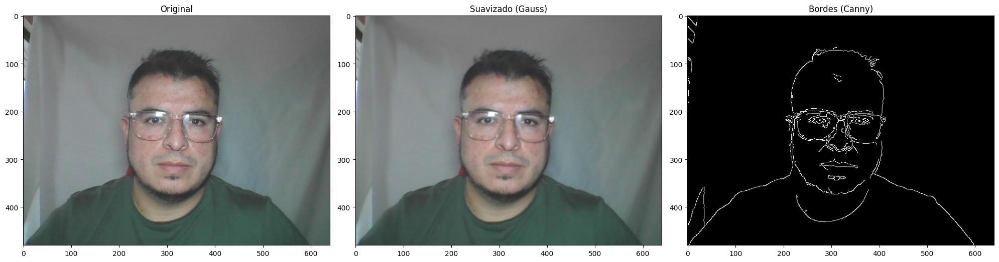

In [ ]:
import cv2
import matplotlib.pyplot as plt


ruta_archivo = "foto_capturada.jpg"

#Carga la imagen
img_bgr = cv2.imread(ruta_archivo)

if img_bgr is None:
    print(f"Error: No se encontró la imagen en {ruta_archivo}")
else:
    # Convertir a RGB para visualización correcta en Matplotlib
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

    # --- OPERACIONES DE VECINDAD (FILTROS) ---

    # A. Suavizado (Gaussian Blur)
    # (15, 15) es el tamaño del kernel (debe ser impar). A mayor número, más borroso.
    img_gauss = cv2.GaussianBlur(img_rgb, (3, 3), 0)

    # B. Detección de Bordes (Canny)
    # Canny es más avanzado que FIND_EDGES. 100 y 200 son los umbrales de detección.
    # Convertimos primero a gris para una mejor detección de bordes
    #img_gris = cv2.cvtColor(img_rgb, cv2.COLOR_BGR2GRAY)
    img_gris = cv2.cvtColor(img_gauss, cv2.COLOR_BGR2GRAY)
    #img_bordes = cv2.Canny(img_gris, 20, 100)
    img_bordes = cv2.Canny(img_gris, 35, 135)
    
    # --- VISUALIZACIÓN ---
    fig, axs = plt.subplots(1, 3, figsize=(20, 5))

    axs[0].imshow(img_rgb)
    axs[0].set_title("Original")

    axs[1].imshow(img_gauss)
    axs[1].set_title("Suavizado (Gauss)")

    # Usamos cmap='gray' porque Canny devuelve una imagen de un solo canal
    axs[2].imshow(img_bordes, cmap='gray')
    axs[2].set_title("Bordes (Canny)")



    for ax in axs: ax.axis('on')
    plt.tight_layout()
    plt.show()

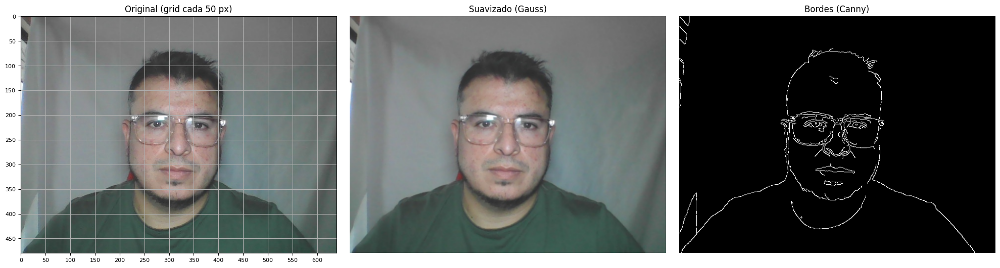

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

ruta_archivo = "foto_capturada.jpg"

img_bgr = cv2.imread(ruta_archivo)

if img_bgr is None:
    print(f"Error: No se encontró la imagen en {ruta_archivo}")
else:
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

    # Gauss
    img_gauss = cv2.GaussianBlur(img_rgb, (3, 3), 0)

    # Canny sobre gauss
    img_gris = cv2.cvtColor(img_gauss, cv2.COLOR_BGR2GRAY)
    img_bordes = cv2.Canny(img_gris, 35, 135)

    h, w = img_rgb.shape[:2]

    fig, axs = plt.subplots(1, 3, figsize=(20, 5))

    # --- Original con cuadrícula cada 50 ---
    axs[0].imshow(img_rgb)
    axs[0].set_title("Original (grid cada 50 px)")

    # ticks cada 50 en ambos ejes
    axs[0].set_xticks(np.arange(0, w+1, 50))
    axs[0].set_yticks(np.arange(0, h+1, 50))

    # cuadrícula visible
    axs[0].grid(True)

    # opcional: que la grilla sea más “fina”
    axs[0].tick_params(labelsize=8)

    # --- Suavizado ---
    axs[1].imshow(img_gauss)
    axs[1].set_title("Suavizado (Gauss)")
    axs[1].axis("off")

    # --- Bordes ---
    axs[2].imshow(img_bordes, cmap='gray')
    axs[2].set_title("Bordes (Canny)")
    axs[2].axis("off")

    plt.tight_layout()
    plt.show()


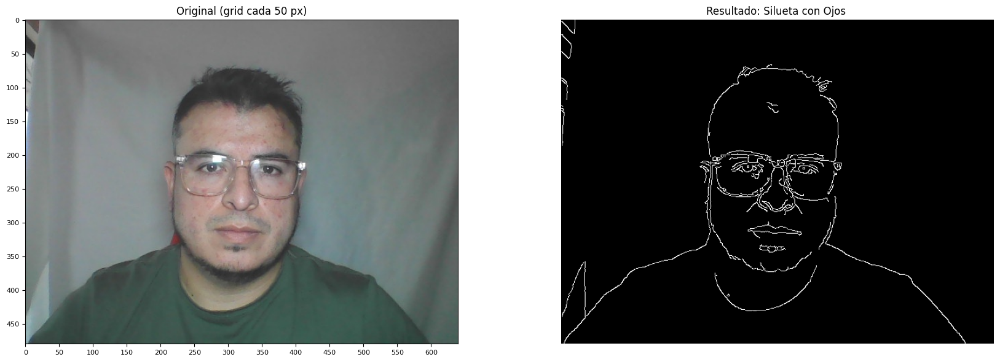

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(18, 6))


axs[0].imshow(img_rgb)
axs[0].set_title("Original (grid cada 50 px)")
axs[0].set_xticks(np.arange(0, w+1, 50))
axs[0].set_yticks(np.arange(0, h+1, 50))
axs[0].grid(False)
axs[0].tick_params(labelsize=8)

axs[1].imshow(img_bordes, cmap="gray")
axs[1].set_title("Resultado: Silueta con Ojos ")
axs[1].axis("off")

plt.tight_layout()
plt.show()

Se busca una silueta sin ojos

In [ ]:
# Ejemplo: img_final = img_bordes  (o tu resultado final)

img_sin_ojos = img_bordes.copy()

# 
# (x1,y1) arriba-izq y (x2,y2) abajo-der

# Ojo izquierdo (desde tu punto de vista mirando la imagen)
x1L, y1L, x2L, y2L = 250, 210, 300, 240

# Ojo derecho
x1R, y1R, x2R, y2R = 340, 210, 380, 250

# “Pintar” (poner a negro)
img_sin_ojos[y1L:y2L, x1L:x2L] = 0
img_sin_ojos[y1R:y2R, x1R:x2R] = 0

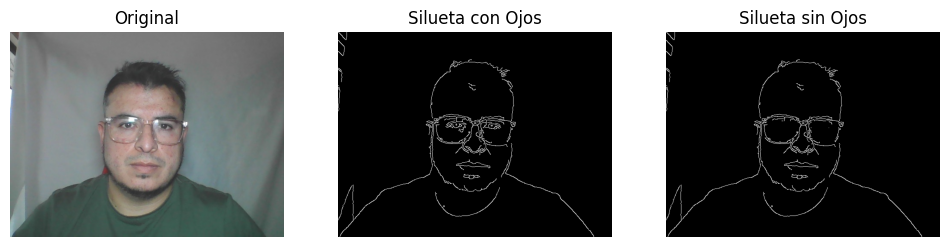

In [ ]:
fig, axs = plt.subplots(1,3, figsize=(12,5))
axs[0].imshow(img_rgb); axs[0].set_title("Original")
axs[1].imshow(img_bordes, cmap="gray"); axs[1].set_title("Silueta con Ojos")
axs[2].imshow(img_sin_ojos, cmap="gray"); axs[2].set_title("Silueta sin Ojos")
for ax in axs: ax.axis("off")
plt.show()

### Otro resultado con el mismo problema, pero en este caso utilizando Pillow (PIL):

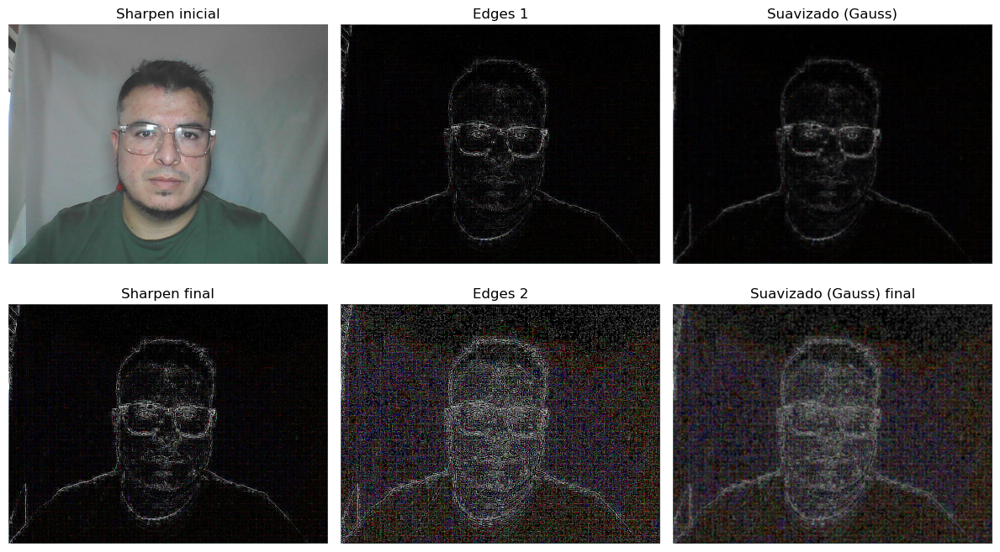

In [5]:
from PIL import Image, ImageFilter
import matplotlib.pyplot as plt

imagen = "C:/Users/Marce/Documents/SenalesImagenes/Tarea1/foto_capturada.jpg"

# 1. Cargar la imagen
img = Image.open(imagen)

# 2. Enfoque inicial (Sharpen)
img_enfoque = img.filter(ImageFilter.SHARPEN)

# 3. Detección de bordes (FIND_EDGES)
img_bordes = img_enfoque.filter(ImageFilter.FIND_EDGES)

# 4. Suavizado para reducir ruido
img_gauss = img_bordes.filter(ImageFilter.GaussianBlur(radius=1))

# 5. Segundo enfoque
img_enfoque_final = img_bordes.filter(ImageFilter.SHARPEN)

# 6. Segunda detección de bordes
img_bordes_final = img_enfoque_final.filter(ImageFilter.FIND_EDGES)

# 7. Limpieza final (suavizado)
img_limpia = img_bordes_final.filter(ImageFilter.GaussianBlur(radius=1))

# Mostrar resultados en 2 filas × 3 columnas
fig, axs = plt.subplots(2, 3, figsize=(12, 7))

# Primera fila
axs[0, 0].imshow(img_enfoque)
axs[0, 0].set_title("Sharpen inicial")
axs[0, 0].axis("off")

axs[0, 1].imshow(img_bordes)
axs[0, 1].set_title("Edges 1")
axs[0, 1].axis("off")

axs[0, 2].imshow(img_gauss)
axs[0, 2].set_title("Suavizado (Gauss)")
axs[0, 2].axis("off")

# Segunda fila
axs[1, 0].imshow(img_enfoque_final)
axs[1, 0].set_title("Sharpen final")
axs[1, 0].axis("off")

axs[1, 1].imshow(img_bordes_final)
axs[1, 1].set_title("Edges 2")
axs[1, 1].axis("off")

axs[1, 2].imshow(img_limpia)
axs[1, 2].set_title("Suavizado (Gauss) final")
axs[1, 2].axis("off")

plt.tight_layout()
plt.show()

La imagen que mejor se ajusta al ejercicio planteado es la obtenida después de aplicar el filtro Edge, por segunda ocasión, aunque en este sentido la imagen es mas ruidosa, que al aplicarle el último suavizado difumina algunos de los detalles de los lentes (suavizado Gauss final).